# PROJECT REPORT
### TITLE: IRRIGATION DETECTION IN AMAHRA, ETHIOPIA
### PROJECT MEMBER: HASAN SIDDIQUI hss2152
### PROJECT DESCRIPTION:

Land Cover Classification is an important problem in remote sensing. In the context of Sub-Saharan Africa (my region of interest), knowledge of existing irrigation systems and techniques aids development of energy infrastructure to provide energy for productive use. This helps policy makers to prioritize such developments that increase agriculture produce and thus help the economy. Land Cover Classification can help identify existing irrigation in small holder farms by looking at the greening change through metrics like EVI (Enhanced Vegetation Index) etc across different seasons mainly dry and wet season.

The idea is simple; if vegetation is present during the dry season, the farmers employ some method of irrigation. However in practice, the complications pile up quickly. These arise due evergreen vegetation, swamps and riverines which makes differentiaiting the different land classes not so straightforward. Thus the training method will require carefully curated datasets that look at the timeseries analysis of the imagery.

Different imagery products exist out there that deal with landcover classification. One such fairly recent product is the ESA World Cover Map [1] at a high resolution of 10 m but this only available for 2020. Another product on which much of the algorithms used to produce ESA landcover classification is based is Copernicus Global Land Service Land Cover (CGLS-LC) map [2] at a coarser resolution 250-500m. These models provide a decent accuracy ~75% (nature of the problem?) and do not focus on irrigation specifically rather croplands, shrubs, forests, built up areas, swamps etc. 

In this project, I use a simple neural network to get good land cover classifications at 10m resolution(focused on irrigated and non-irrigated).

### INPUT FEATURES
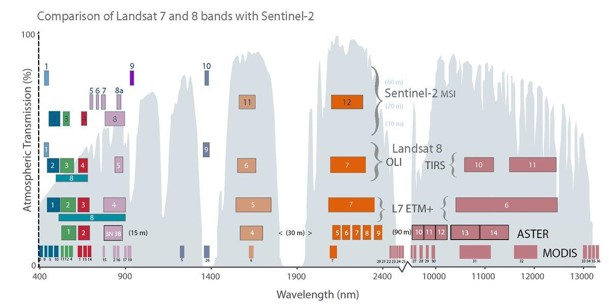

The image shows different Satellite imagery products available and comparison of the different bands. For this project, I have used MODIS(250m) and Sentinel 2(10m) imagery. I'm using Red (substrate), Blue (water) and Near Infrared Bands (vegetation) for three years 2017-2019. To reduce the input dimensions, I compute the Enhanced Vegetation Index (EVI) which is one of the best measures of vegetation. It is calculated as 2.5*(NIR-RED)/(NIR+6*RED-7.5*BLUE+1). Another feature used in the data gathering process is the CHIRPS dataset [3] which is rainfall data at 5km resolution 

### FEATURE SPACE
To examine the feature space, I start with EVI extracted from MODIS low resolution imagery of Ethiopia. Principal Component Analysis is performed using ENVI software and the feature space if plotted for the first three principal components shown below. [4]
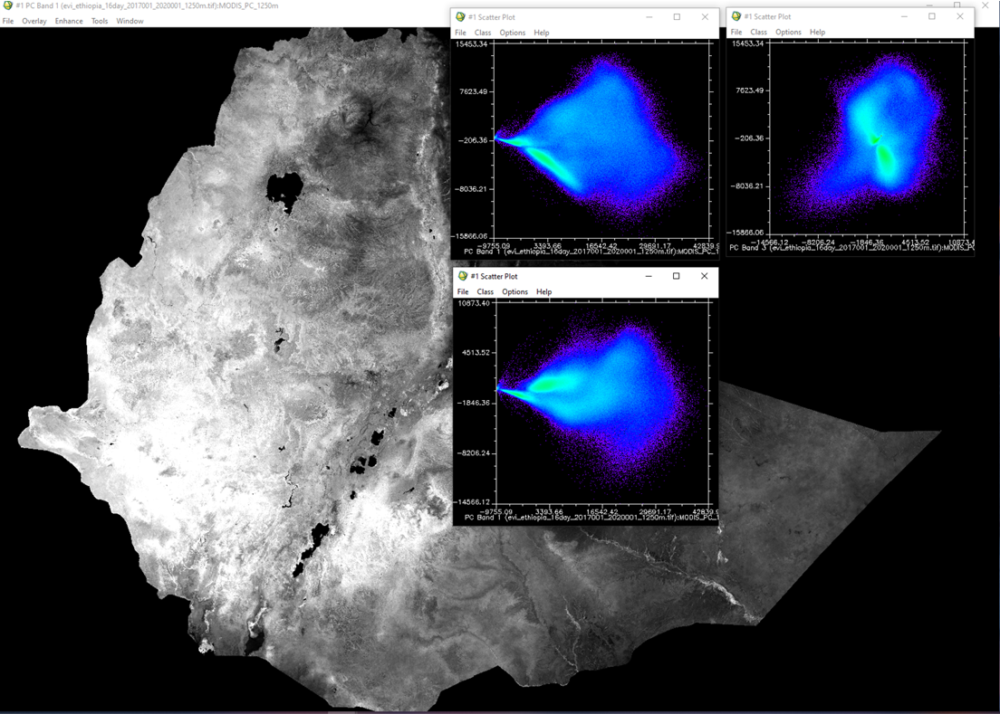

The edges of the feature space correspond to different phenologies present in Ethiopia. Every point in the feature space cloud can be represented as a mixture of these distinct signatures/phenologies and this gets into mixture modeling which is not the goal here. However this can help us understand how to collect data and how to identify irrigated and non-irrigated plots. The distinct endmembers (edges of the feature space cloud) are shown below.
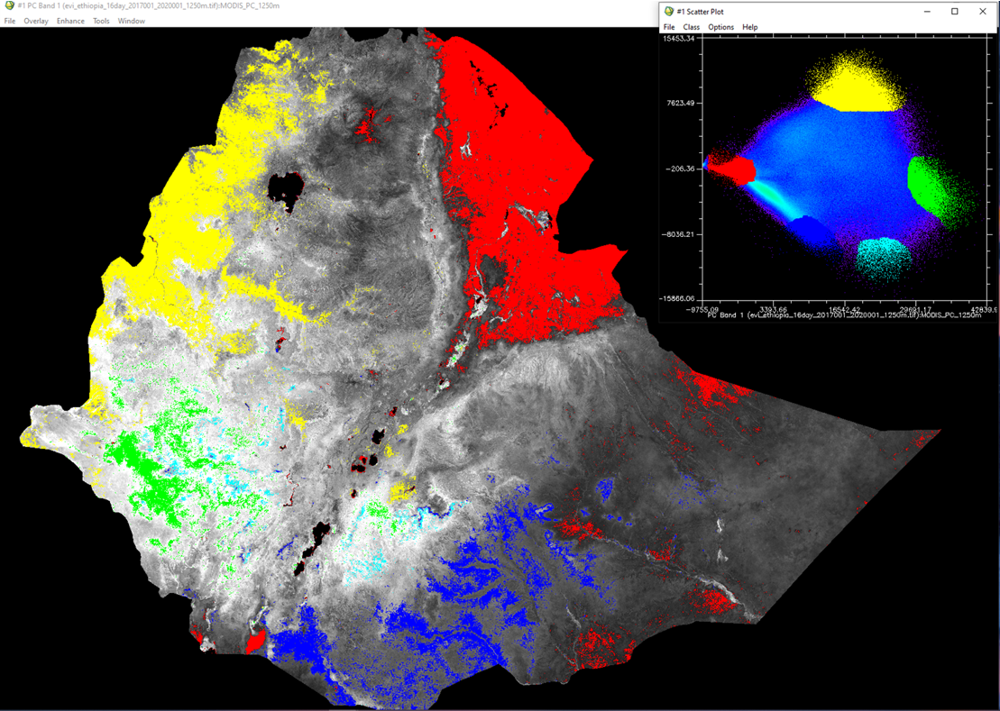

Plot of the phenologies
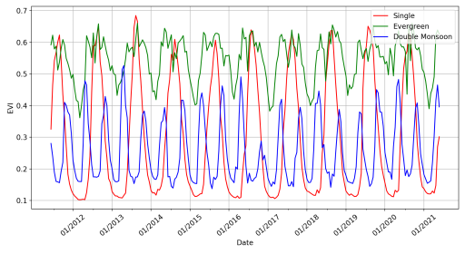

The entire country can be respresented as a mixture of the distinct phenologies plotted above
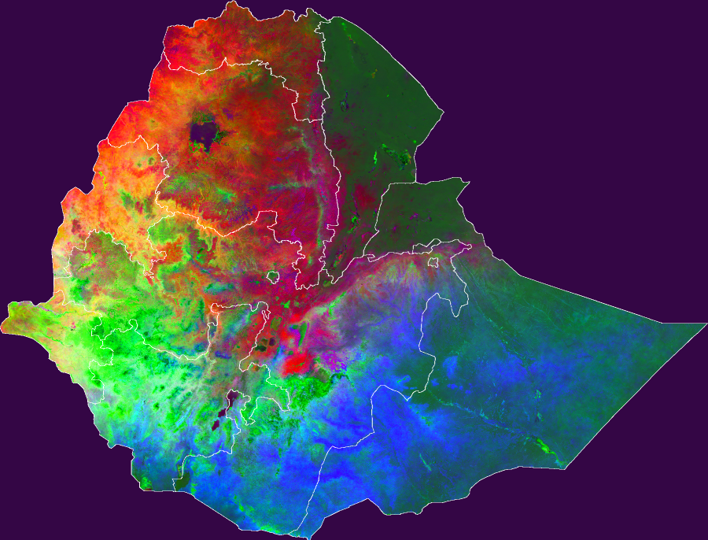

### DATA COLLECTION
The process of data collection is an arduous method of generating labels by looking at Sentinel-2 imagery (10m resolution) time series and high-resolution sub-meter imagery from Google Earth Pro. These polygons are collected for my initial region of interest in Amhara, Ethiopia in sub-saharan Africa. Now this area is massive 155,000 sqkm so I start by randomly sampling 10km x 10km grids in this region and creating labels within a grid. Each label is classified as either irrigated or non-irrigated based on the vegetation profile throughout the year.

The screenshot below shows landcover map near Lake Tana in Amhara, Ethiopia
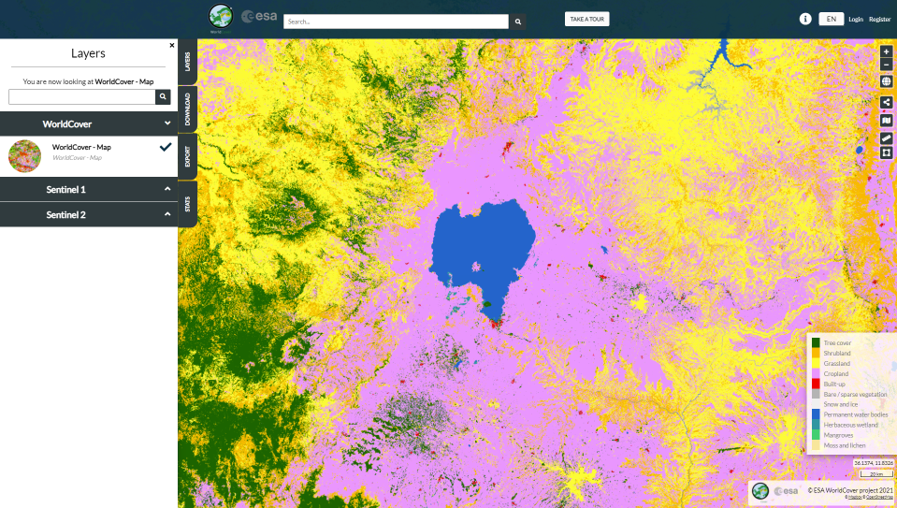

#### Cleaning large polygons to extract clusters (not used eventually) [5]
One of the techniques I tried initially to collect data is to draw huge polygons and then analyzing the underlying MODIS imagery. This is based on the github repository [5]. Then areas with distinct phenologies can be clustered together and this can be extracted to feed in to the deep learning model. This method was not feasible due to the huge computation invovled in clustering large polygons to "clean" them. To see more about this method refer to the code cells attached in the Appendix. Here's a screenshot from the methodology where I feed a large polygon that I think is non irrigated and the underlying EVI imagery. The script clusters different phenologies and plots them and gives me the option to select the phenologies I'm interested in. For example cluster 1 represents evergreen regions because the vegetation never drops, These are regions such as forests, swamps etc that remain green all year round so I can choose to get rid of this cluster and save the rest.
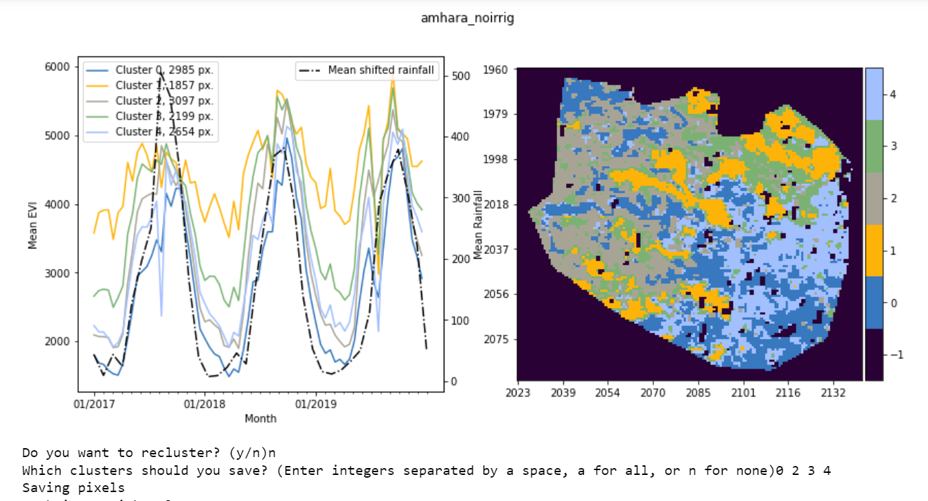

#### Drawing smaller polygons
To collect input data, I settled on using a tool developed by Terence Conlon in Descartes Labs [6]. The tool allows you to draw polygons on Sentinel imagery and then extracts the EVI timeseries for all the pixels in the imagery and displays a plot. You can chose to save the polygon as either irrigated or non-irrigated. This is the most time consuming step in the entire project as you have to look at very high resolution imagery in Google Earth to figure out the landscape, draw a polygon, decide and save it. This has to be repeated for each polygon drawn. To do this I divided Amhara into 10 km x10 km grids. Randomly select grids to get a random sample and examine the imagery in each grid for irrigated and non-irrigated polygons. An example of a grid is shown below. The first figure shows the plot for an irrigated polygon. In the plot in the screenshot, the two lines represent the dry season. The EVI peak shows dry season vegetation in this area and hence we know this polygon is irrigated. In the next figure no peak is visible in the dry season and hence this region is not irrigated. The horizontal line represents the EVI value of 0.2 which is set as a threshold to guage whether the vegetation peaks in certain seasons.
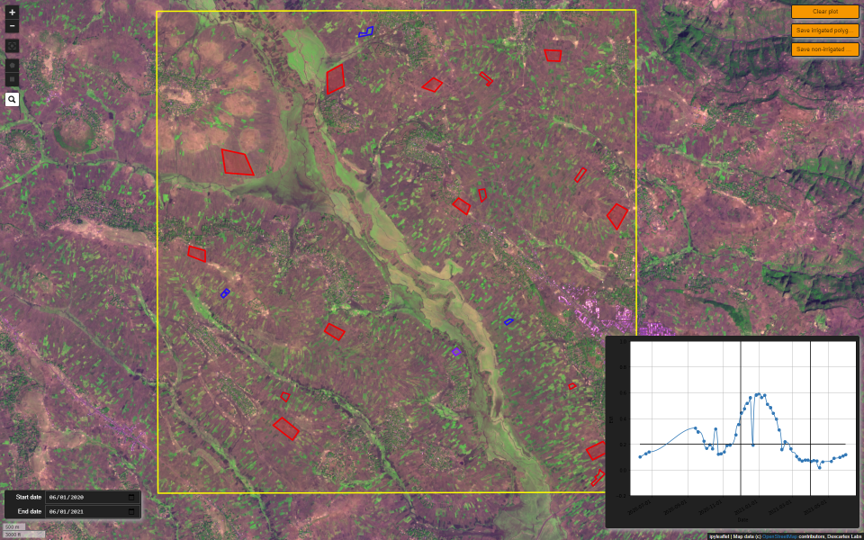

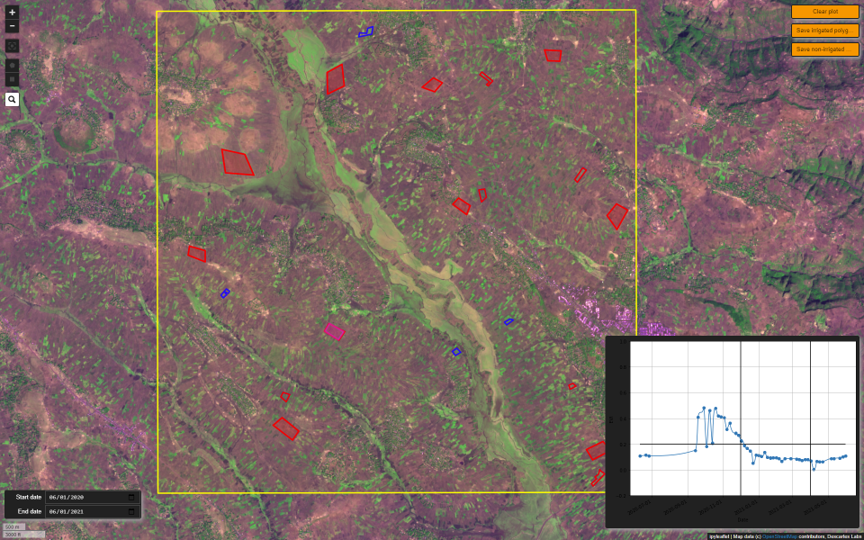

### Polygon Statistics
Non-irrigated (red):

-1082 polygons

-3808.6 Ha

-362600 px

Irrigated (blue):

-519 polygons

-582.2 Ha

-55753 px

The image below shows all the polygons collected in Amhara and represents about 50-60 hrs of data collection

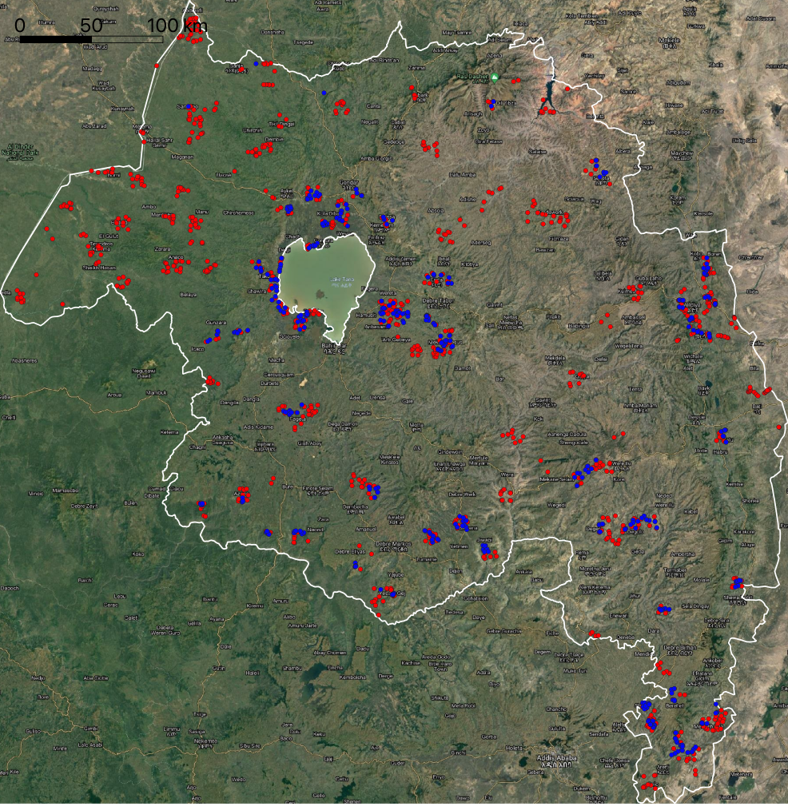

### Importing the libraries

In [1]:
import pandas as pd
import tensorflow as tf
import rasterio
from rasterio.plot import show
from rasterio.merge import merge
from matplotlib import pyplot
import math
import numpy as np
from rasterio.plot import show_hist

In [2]:
tf.__version__

'2.1.0'

## Data Preprocessing
After the polygons are collected, the underlying EVI processed from Sentinel 2 bands is extracted as tif files. (See Raster Manipulation functions just before the references). These tif files are read into a dataframe as individual pixel values.

### Importing the dataset

In [217]:
src = rasterio.open(f"C:/Users/hssid/Desktop/DL4CV/data/Irrigated/EVI_10m_irrig_1.tif")

img = src.read()[1]
meta = src.meta

a={}
for i in range(36):
    img = src.read()[i]
    a[i]= img[np.where(img != meta['nodata'])]
    

stack = np.dstack((a[k] for k in range(36)))
stack = stack[0,:,:]

df = pd.DataFrame(stack)


irrig_invalid=[70,71,72,73,75,76,77,95,101,102,103,107,108]

for j in range(107):
    if j+2 not in irrig_invalid:
        src = rasterio.open(f"C:/Users/hssid/Desktop/DL4CV/data/Irrigated/EVI_10m_irrig_{j+2}.tif")

        img = src.read()[1]
        meta = src.meta

        a={}
        for i in range(36):
            img = src.read()[i]
            a[i]= img[np.where(img != meta['nodata'])]

        stack = np.dstack((a[k] for k in range(36)))
        stack = stack[0,:,:]

        df2 = pd.DataFrame(stack)
        df=df.append(df2, ignore_index=True)
        


df['irrig'] = 1
print(df.shape)

C:\Users\hssid\anaconda3\envs\gis3.6\lib\site-packages\ipykernel_launcher.py:12: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if sys.path[0] == '':
C:\Users\hssid\anaconda3\envs\gis3.6\lib\site-packages\ipykernel_launcher.py:32: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.


(4784, 37)


In [218]:
nonirrig_invalid=[1,2,3,4,7,8,9,11,31,32,34,37,38,39,40,42,43,44,47,50,52,54,59,60,62]
for j in range(50):
    if j+1 not in nonirrig_invalid:
        src = rasterio.open(f"C:/Users/hssid/Desktop/DL4CV/data/Non-irrigated/EVI_10m_nonirrig_{j+1}.tif")

        img = src.read()[1]
        meta = src.meta

        a={}
        for i in range(36):
            img = src.read()[i]
            a[i]= img[np.where(img != meta['nodata'])]

        stack = np.dstack((a[k] for k in range(36)))
        stack = stack[0,:,:]

        df2 = pd.DataFrame(stack)
        df2['irrig'] = 0
        df=df.append(df2, ignore_index=True)


print(df.shape)

C:\Users\hssid\anaconda3\envs\gis3.6\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  


(11596, 37)


In [219]:
df = df.sample(frac=1).reset_index(drop=True)
df

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,irrig
0,729,821,620,684,620,582,816,2222,3027,2888,...,567,493,431,1250,2068,2861,6023,5360,700,0
1,711,723,1978,6132,5963,1804,598,1660,4183,846,...,1254,1385,2210,1863,1512,1423,1374,1837,3921,1
2,1021,763,920,843,1938,1343,3478,4794,4008,2174,...,1167,959,1853,1541,4078,5674,3105,2158,1597,0
3,620,528,1001,917,1009,660,573,1035,5592,5295,...,640,622,720,389,2163,5467,3961,2837,1070,0
4,872,581,1418,1701,2030,1015,753,1126,5869,6889,...,1700,5426,6043,788,8321,5845,5724,4289,1776,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11591,576,719,563,829,1637,2575,2811,5080,5525,924,...,3284,5245,1538,1614,5330,5743,826,805,4435,0
11592,1003,805,700,825,1664,1245,3026,4409,3645,3381,...,2064,1196,2543,1925,4059,5444,4002,3001,2328,0
11593,3075,2419,3944,4280,5396,3246,4134,5414,5874,5626,...,1011,2272,4774,4931,3529,1515,2213,5797,5565,0
11594,740,590,2327,4094,1640,1055,928,2698,4088,5478,...,5012,1124,1903,755,4901,6284,5304,3810,2319,0


In [220]:
X = df.iloc[:, 0:-1].values
y = df.iloc[:, -1].values

In [221]:
print(X)

[[ 729  821  620 ... 6023 5360  700]
 [ 711  723 1978 ... 1374 1837 3921]
 [1021  763  920 ... 3105 2158 1597]
 ...
 [3075 2419 3944 ... 2213 5797 5565]
 [ 740  590 2327 ... 5304 3810 2319]
 [ 893  709  579 ... 3789 3227 1140]]


In [222]:
print(y)

[0 1 0 ... 0 0 1]


### Splitting the dataset into the Training set and Test set

In [223]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

## Building the ANN
A simple Neural network is built with 3 hidden layers and 8 units each

In [224]:
nn = tf.keras.models.Sequential()
nn.add(tf.keras.layers.Dense(units=8, activation='relu'))
nn.add(tf.keras.layers.Dense(units=8, activation='relu'))
nn.add(tf.keras.layers.Dense(units=8, activation='relu'))
nn.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

In [225]:
nn.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

### Training the ANN on the Training set

In [226]:
X_train=np.asarray(X_train).astype(np.int)
y_train=np.asarray(y_train).astype(np.int)

nn.fit(X_train, y_train, batch_size = 32, epochs = 100)

Train on 9276 samples
Epoch 1/100
9276/9276 [==============================] - 1s 95us/sample - loss: 170.0647 - accuracy: 0.5161
Epoch 2/100
9276/9276 [==============================] - 0s 46us/sample - loss: 0.8941 - accuracy: 0.6518
Epoch 3/100
9276/9276 [==============================] - 0s 47us/sample - loss: 0.6853 - accuracy: 0.6506
Epoch 4/100
9276/9276 [==============================] - 0s 47us/sample - loss: 0.6425 - accuracy: 0.6493
Epoch 5/100
9276/9276 [==============================] - 0s 47us/sample - loss: 0.6401 - accuracy: 0.6509
Epoch 6/100
9276/9276 [==============================] - 0s 44us/sample - loss: 0.6507 - accuracy: 0.6539
Epoch 7/100
9276/9276 [==============================] - 0s 45us/sample - loss: 0.6407 - accuracy: 0.6515
Epoch 8/100
9276/9276 [==============================] - 0s 44us/sample - loss: 0.6448 - accuracy: 0.6475
Epoch 9/100
9276/9276 [==============================] - 0s 44us/sample - loss: 0.6501 - accuracy: 0.6486
Epoch 10/100
9276/9276

## Making the predictions and evaluating the model

### Predicting the Test set results

In [229]:
X_test=np.asarray(X_test).astype(np.int)

y_pred = nn.predict(X_test)
y_pred = (y_pred > 0.5)

print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

[[0 0]
 [1 1]
 [1 1]
 ...
 [0 1]
 [1 1]
 [0 0]]


### Confusion Matrix

In [230]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[1338   11]
 [  96  875]]


0.9538793103448275

## DISCUSSION

The model does well in predicting the irrigated regions from non-irrigated regions. Note that not all of non-irrigated dataset was read in because the non-irrigated dataset is much larger than the irrigated dataset and the model could have achieved a decent accuracy by just predicting everything as non-irrigated. From the confusion matrix, we can see that the model achieves 95% accuracy with an error rate of 4.6%

The next step in this work is to expand the classification to include more classes and increase the difficulty of the problem. This would require a different way data collection where tiles say 1kmx1km would be gathered and each pixel in the tile would be identified by the data collection team in one of the different classes. This is a much harder problem to gather data for.

The phenology in Ethiopia are easier to identify becuase of a distinct dry season but for a country like Uganda which does not have a distinct dry season nor does it recieve ample to rainfall through out the year to not justify the need for irrigation, the same binary classification model gets a lot difficult. Unpredictability in rainfall is also a factor when considering such reasons. For this problem LSTMs and Transformers might be needed to work through the complexity.

## Raster Manipulation Functions

In [18]:
import fiona
import rasterio
import rasterio.mask
import numpy as np

with fiona.open("C:/Users/hssid/Desktop/DL4CV/data/37PEP_nonirrig.geojson", "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]
    print(shapefile.crs)
len(shapes)

{'init': 'epsg:4326'}


86

In [23]:
j=164
for i in shapes:
    with rasterio.open("C:/Users/hssid/Desktop/DL4CV/data/T37PEP.tif") as src:
        out_image, out_transform = rasterio.mask.mask(src, [i], crop=True)
        out_meta = src.meta
        
    out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})
    
    with rasterio.open(f"C:/Users/hssid/Desktop/DL4CV/data/Non-irrigated/EVI_10m_nonirrig_{j}.tif", "w", **out_meta) as dest:
        dest.write(out_image)
    j+=1

#### References
[1] https://esa-worldcover.org/en/data-access

[2] https://land.copernicus.eu/global/access

[3] https://data.chc.ucsb.edu/products/CHIRPS-2.0/

[4] Small C. Spatiotemporal dimensionality and Time-Space characterization of multitemporal imagery. Remote Sens Environ 2012;124:793–809. https://doi.org/10.1016/j.rse.2012.05.031.

[5] https://github.com/tconlon/irrigation_detection

[6] https://descarteslabs.com/